# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifer using TensorFlow 2.0 and Tensorflow Hub.


## 1. Probelm

Identifying the breed of a dog give an image of a dog.
When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog its is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competetion.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilites for each dog breed of each test image.

## 4.

Some information about the data:
* We're dealing with images (unstructuerd data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000 + images in the training set
* There are around 10,000 + images in the test set (these have no labels, because we'll want to predict them).

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensoFlow Hub
* Make sure we're using a GPU

In [1]:
# Import TensofFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)
print("TF version:", tf.__version__)

# Check for GPU availability
print("GPU", "available (YESSSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

TF Hub version: 0.16.1
TF version: 2.15.0
GPU available (YESSSSS!!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first Turning our data into tensors.

Let's start by accessing our data and checking out the labels

In [2]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

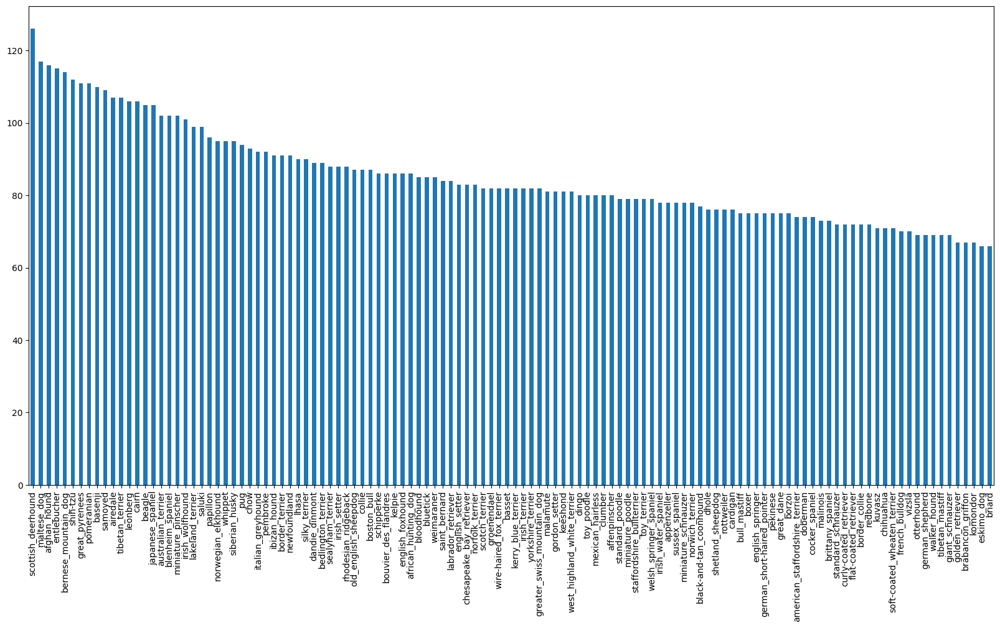

In [4]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))


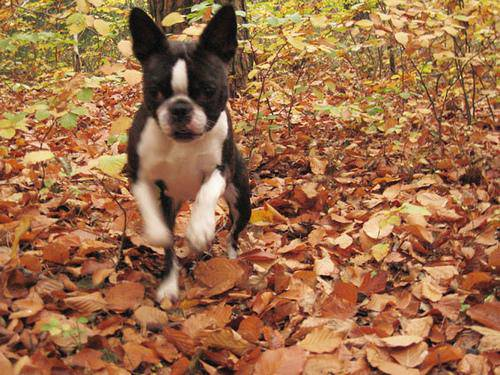

In [5]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [6]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-

In [7]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


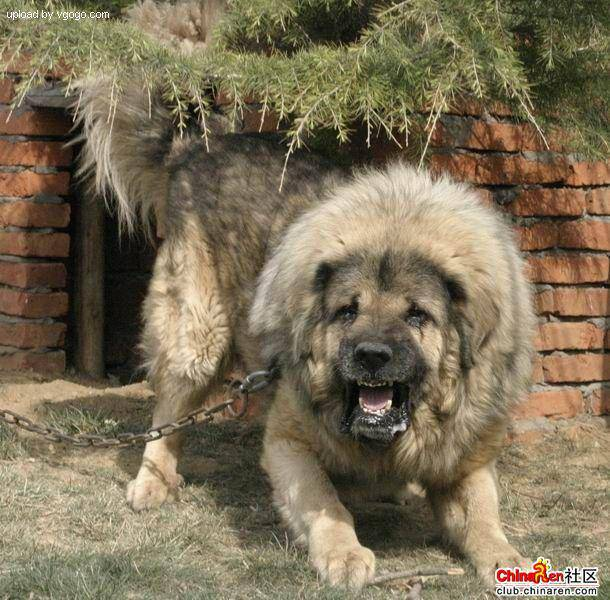

In [8]:
# One more check
Image(filenames[9000])

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [9]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [10]:
len(labels)

10222

In [11]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories")

Number of labels matches number of filenames!


In [12]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [13]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [14]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [15]:
len(boolean_labels)

10222

In [16]:
# Example: Turning boolean array inot integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn’t come with a validation set, we're going to create our own.

In [17]:
# Setup X & y variables
X  = filenames
y = boolean_labels

We're going to start off experimenting with ~100 images and increase as needed.

In [18]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param{type:"slider", min:1000, max:10000}

In [19]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [20]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fa

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing looks like.

In [21]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [22]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [23]:
# Turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our images (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [24]:
# Define image size
IMG_SIZE =224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])


  return image



## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples whick look like this:
`(image, label)`.

In [25]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [26]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X`, &`y`) into batches!

In [27]:
# Define the batch size , 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data = False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accupts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches..")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnamnes and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X ))

    # Create (image, label) tuples (this also turns the image path into a preporcessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [28]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches..
Creating validation data batches...


In [29]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them.

In [30]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [31]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

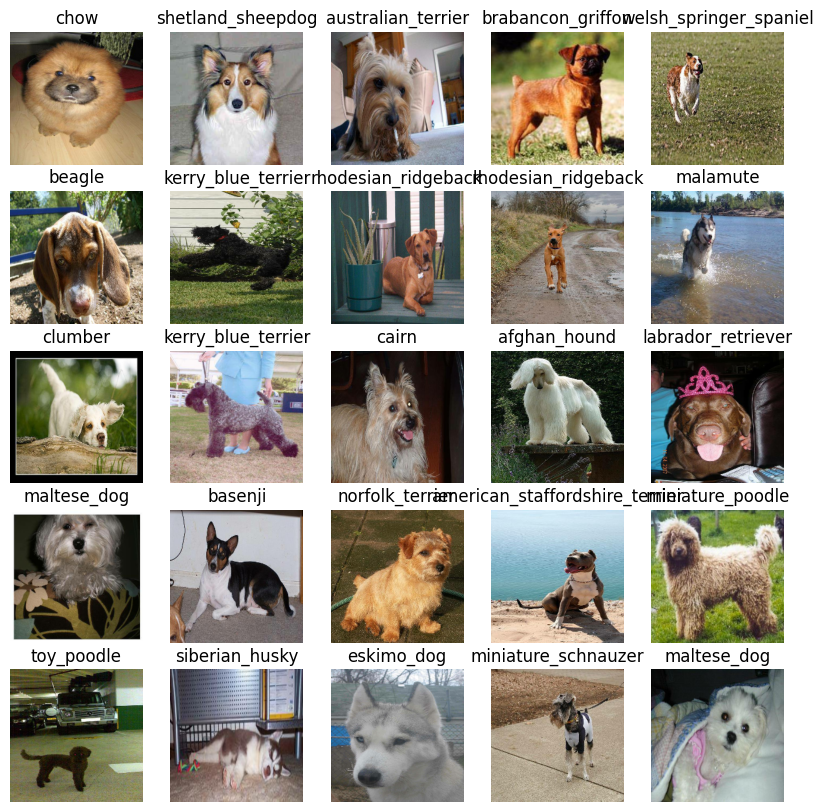

In [32]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

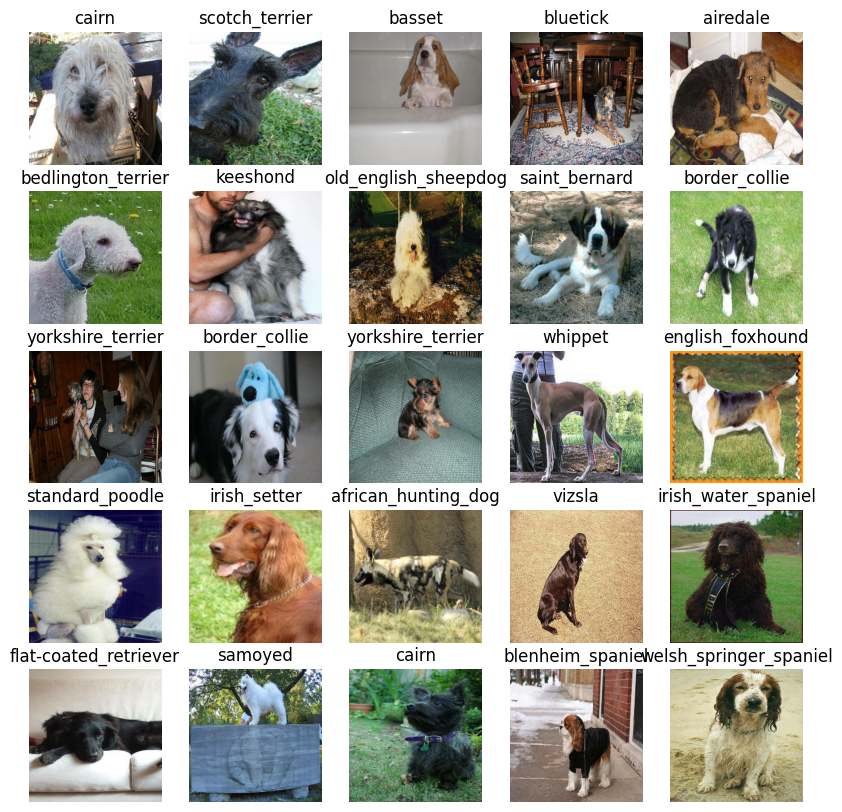

In [33]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.
* The URL of the model we want to use from TensorFlow Hub - "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2

In [34]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2"



Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning mode.!

Knowing this, let's create a function which:
* Takes the input shape,
output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [35]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)


  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalFocalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
      )
  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [36]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              1692489   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 1812729 (6.92 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 1692489 (6.46 MB)
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress,
check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model fromo training for too long.

#### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [37]:
# load TensorBoard notebook extension
%load_ext tensorboard

In [38]:
import datetime

# Create a function to build a TensorBoard logs
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)



### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops

In [39]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience = 3)

### Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [40]:
NUM_EPOCHS = 100 # @param {type:"slider", min:0, max:100, step:1}

Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [41]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model

In [42]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 276s 11s/step - loss: 1.3379 - accuracy: 0.0525 - val_loss: 0.9729 - val_accuracy: 0.1300
Epoch 2/100
25/25 [==============================] - 4s 176ms/step - loss: 0.4171 - accuracy: 0.4950 - val_loss: 0.6773 - val_accuracy: 0.3050
Epoch 3/100
25/25 [==============================] - 4s 150ms/step - loss: 0.1064 - accuracy: 0.8712 - val_loss: 0.6007 - val_accuracy: 0.3300
Epoch 4/100
25/25 [==============================] - 3s 137ms/step - loss: 0.0287 - accuracy: 0.9775 - val_loss: 0.6069 - val_accuracy: 0.3300
Epoch 5/100
25/25 [==============================] - 4s 160ms/step - loss: 0.0101 - accuracy: 0.9975 - val_loss: 0.6033 - val_accuracy: 0.3350
Epoch 6/100
25/25 [==============================] - 4s 157ms/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 0.5974 - val_accuracy: 0.3350
Epo

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic funtion (`%tensorboard`) will access the logs directory we created earlier and visualizes its contents.

In [43]:
%tensorboard --logdir /content/drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [44]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [45]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 152ms/step


array([[5.9441710e-03, 7.7712275e-03, 5.7770536e-05, ..., 1.3284854e-04,
        6.8860534e-03, 1.9812211e-02],
       [1.9266589e-02, 9.0334535e-04, 9.2400555e-03, ..., 7.5405238e-05,
        7.9373224e-04, 2.1970852e-03],
       [5.6519144e-05, 3.5155693e-04, 5.4830912e-06, ..., 5.8659110e-02,
        1.9065738e-03, 4.1541345e-02],
       ...,
       [1.3629675e-05, 4.2047901e-05, 4.7035655e-04, ..., 9.2422107e-04,
        7.6733413e-04, 2.0889400e-03],
       [3.1842905e-04, 5.3477148e-04, 1.7254866e-03, ..., 1.9984760e-05,
        6.5281469e-04, 1.1555168e-03],
       [2.4091285e-04, 1.2358511e-03, 1.0358051e-03, ..., 5.7645435e-03,
        2.9526819e-03, 2.6272619e-03]], dtype=float32)

In [46]:
predictions.shape

(200, 120)

In [47]:
len(y_val)

200

In [48]:
len(unique_breeds)

120

In [49]:
# First predidction
index = 80
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted breed: {unique_breeds[np.argmax(predictions[index])]}")

[1.60325872e-04 2.36240506e-01 5.11550161e-06 1.74436194e-03
 8.52623396e-03 1.24741814e-06 5.10932186e-05 4.26435736e-06
 3.01903188e-01 4.16423136e-04 1.32110761e-03 1.34163301e-05
 1.30341205e-05 3.79005040e-04 6.83936710e-03 1.34619449e-05
 1.67144499e-05 7.88197480e-03 6.76919008e-05 8.60067375e-04
 5.80262094e-05 3.44408734e-04 2.10777158e-04 8.43548842e-05
 1.52125052e-04 2.09340898e-04 3.34840198e-03 4.41372162e-04
 2.41086097e-03 1.79048255e-03 3.54186923e-04 1.53710687e-04
 4.25267592e-03 2.78489824e-05 7.34398840e-04 1.56912650e-03
 7.26485541e-06 1.12848102e-04 3.67348621e-05 1.01867052e-04
 1.37587951e-04 3.43761785e-05 1.28061409e-04 1.24156475e-03
 2.74274516e-05 6.35175174e-03 3.52629460e-04 4.14266367e-04
 1.60232801e-02 1.19947021e-04 4.69809347e-05 4.77879912e-05
 3.52375349e-03 5.59466844e-06 1.38804739e-04 1.18907343e-03
 8.20765924e-03 3.40797286e-03 9.59946832e-04 3.62586766e-03
 7.35099165e-05 1.46937920e-04 3.57033964e-03 3.62833217e-03
 2.47270218e-04 5.350766

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [50]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(pred_probs):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(pred_probs)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[80])
pred_label

'basset'

In [51]:
unique_breeds[80]

'norwegian_elkhound'

In [52]:
unique_breeds[index]

'norwegian_elkhound'

In [53]:
predictions.shape

(200, 120)

In [54]:
len(y_val)

200

In [55]:
np.sum(predictions[index])

1.0

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [56]:
# Create a function to unbatch  a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of image-label Tensors and returns separate arrays for
  images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [57]:
get_pred_label(val_labels[0])

'affenpinscher'

In [58]:
images = []
labels = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images.append(image)
  labels.append(label)

In [59]:
images[0], labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [60]:
get_pred_label(labels[0])

'cairn'

In [61]:
get_pred_label(predictions[0])

'lhasa'

Now we've got ways to get:
* Prediction labels
* Validation labels
* Validation images

Let's make some function to make these all a bit more visuzalize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [62]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)
  plt.show()

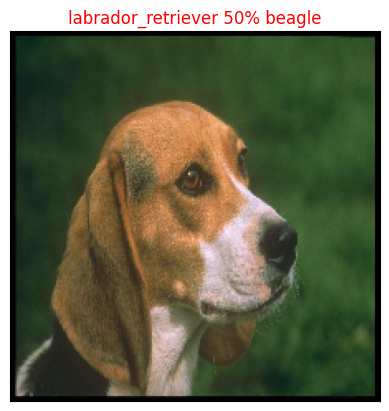

In [63]:
plot_pred(predictions, val_labels, val_images, n=120)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green. ✅

In [64]:
def plot_pred_conf(prediction_probabilities, labels, images, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Plot the top 10 prediction
  top_plot  = plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')

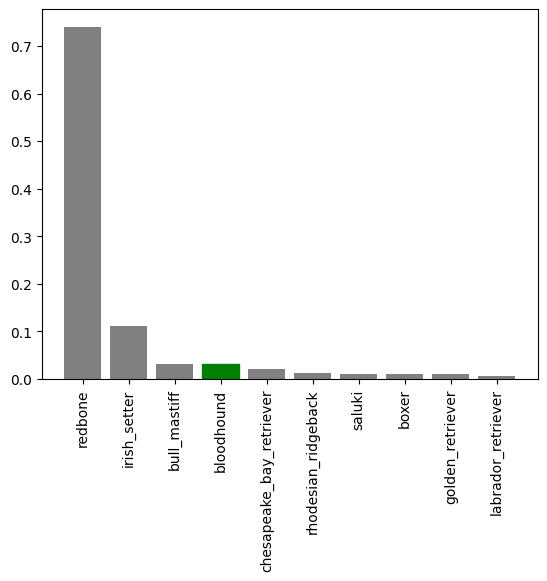

In [65]:
plot_pred_conf(predictions, val_labels, val_images, n=100)

Now we've got some function to help us visualize our models predictions and evaluate our model, let's check out a few.

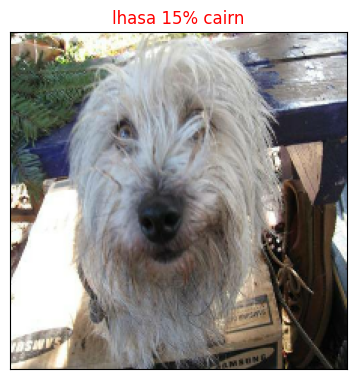

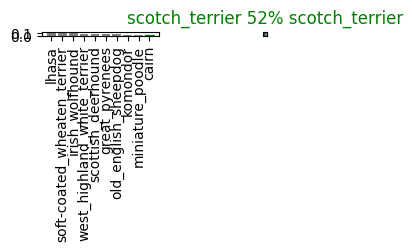

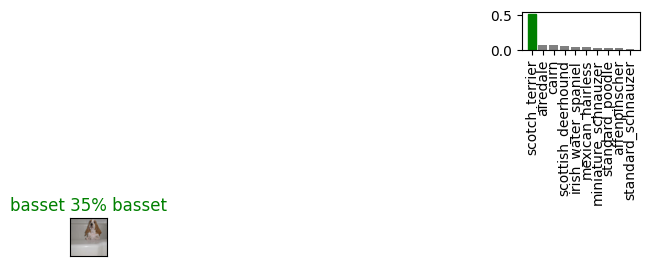

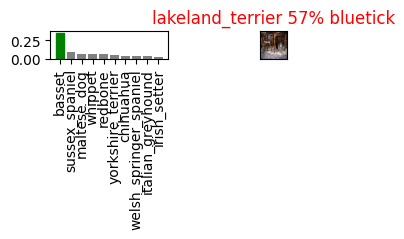

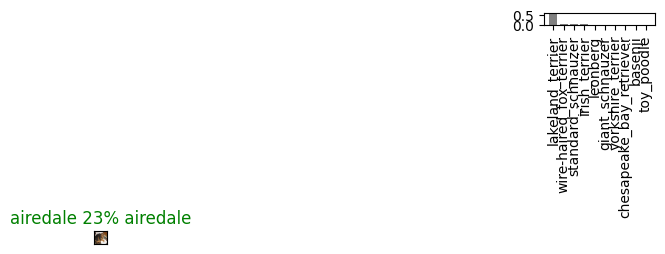

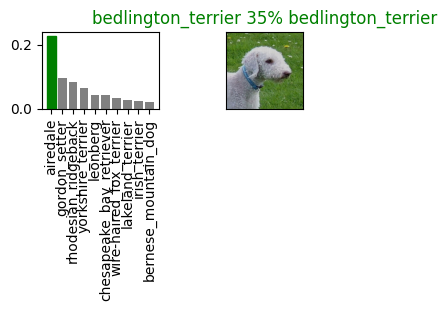

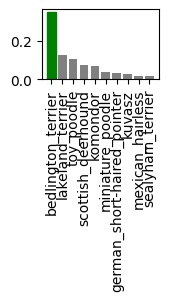

In [70]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions, labels = val_labels, images=val_images, n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [71]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and apppends a suffix to the filename.
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/ Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [72]:
# Create a function to load a trainded model
def load_model(model_path):
  """
  Loads a saved model from a given path.
  """
  print(f"Loading saved model from: {model_path}")
  return tf.keras.models.load_model(model_path,
                                    custom_objects={'KerasLayer':hub.KerasLayer})

Now we've got a function to save and load a model.

In [73]:
# Save out model trained on 100 images
save_model(model=model, suffix="100_images-mobilenetv2-Adam")

Saving model to: drive/My Drive/ Dog Vision/models/20240302-062807-100_images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/ Dog Vision/models/20240302-062807-100_images-mobilenetv2-Adam.h5'

In [75]:
loaded_1000_images_model = load_model('drive/My Drive/ Dog Vision/models/20240302-062807-100_images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/ Dog Vision/models/20240302-062807-100_images-mobilenetv2-Adam.h5


In [76]:
# Evaluate the pre-saved model
model.evaluate(val_data)


7/7 [==============================] - 1s 148ms/step - loss: 0.5924 - accuracy: 0.3450


[0.5923761129379272, 0.3449999988079071]

In [77]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 2s 151ms/step - loss: 0.5924 - accuracy: 0.3450


[0.5923761129379272, 0.3449999988079071]

## Training a big model 🐶 (on the full data)

In [79]:
len(X), len(y)

(10222, 10222)

In [80]:
# Create  a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches..


In [81]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [82]:
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2


In [85]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                              patience=3)

**Note:** Running the cell below will take a little while.

In [86]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 62s 177ms/step - loss: 0.4800 - accuracy: 0.4419
Epoch 2/100
320/320 [==============================] - 40s 126ms/step - loss: 0.2087 - accuracy: 0.6706
Epoch 3/100
320/320 [==============================] - 40s 125ms/step - loss: 0.1441 - accuracy: 0.7416
Epoch 4/100
320/320 [==============================] - 40s 126ms/step - loss: 0.1023 - accuracy: 0.7942
Epoch 5/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0742 - accuracy: 0.8333
Epoch 6/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0576 - accuracy: 0.8642
Epoch 7/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0420 - accuracy: 0.8914
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0317 - accuracy: 0.9162
Epoch 9/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0250 - accuracy: 0.9297
Epoch 10/100
320/320 [==============================] - 40s 124m

In [89]:
save_model(full_model, suffix="full_image_set_mobilenetv2-Adam")

Saving model to: drive/My Drive/ Dog Vision/models/20240302-072239-full_image_set_mobilenetv2-Adam.h5...


'drive/My Drive/ Dog Vision/models/20240302-072239-full_image_set_mobilenetv2-Adam.h5'

In [90]:
loaded_full_model = load_model('drive/My Drive/ Dog Vision/models/20240302-072239-full_image_set_mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/ Dog Vision/models/20240302-072239-full_image_set_mobilenetv2-Adam.h5


## Making predidctions on the test data

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

To make predidctions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_bathces()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make predictions array by passing the test batches to the `predict()` method called on our model.

In [144]:
# Load test image filenames
test_path = 'drive/MyDrive/Dog Vision/dog-breed-identification/test'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/teste193c532dc7c9a5ee397848a1ee007f0.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/teste3a7aeb038b8abd3f8ed910c84504efc.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/teste65bf4e655ccf594210174f124e3adf0.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/teste1e7949f64ff3283a5dafa9d39199193.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/teste3ff13afe2400a95e3ab76759d94fbc4.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/teste6f07d64c2380bbde03a7b6ade01b859.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/teste1f4d57ee24b11a0d1a24b83e12d6bb7.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/testdd2c0c44f98af0cf223572a1aa189779.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/teste265af5e8f446888c6e7ec31f803d63e.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/testf3925f914650b1edf59ce7da36abda31.jpg']

In [145]:
len(test_filenames)

10367

In [95]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [96]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1818s 6s/step


In [98]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt('drive/My Drive/Dog Vision/dog-breed-identification/test_predictions.csv',
           test_predictions,
           delimiter=',')


In [101]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog Vision/dog-breed-identification/test_predictions.csv', delimiter = ",")
test_predictions

array([[9.99161216e-07, 1.78860908e-04, 8.04332601e-10, ...,
        4.27883862e-07, 4.32722707e-04, 4.63533434e-05],
       [1.24828670e-09, 2.37787634e-09, 2.25946306e-09, ...,
        5.77018078e-09, 7.12484643e-02, 1.00681409e-05],
       [3.54514242e-07, 1.55465841e-05, 2.32550992e-10, ...,
        7.42355621e-10, 1.28355840e-10, 1.44553496e-06],
       ...,
       [2.23076269e-09, 2.37849393e-11, 1.66905647e-13, ...,
        2.74413092e-09, 1.54658139e-03, 8.82731183e-06],
       [7.51166504e-14, 1.06705904e-13, 3.47166212e-10, ...,
        3.54558207e-13, 5.71209025e-10, 5.27590505e-09],
       [1.08980475e-05, 1.27534525e-08, 3.89004134e-10, ...,
        1.41313933e-07, 9.43212086e-08, 2.81982921e-07]])

In [102]:
test_predictions.shape

(10367, 120)

## Preparing test dataset predictions Kaggle

Looking ata the Kaggle sample submission, we find that it wants our models predictions probability outputs in a csv file with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with and ID column as well as a column for each dog breed
* Add the data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [132]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [133]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.split(path)[1].split(".")[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e193c532dc7c9a5ee397848a1ee007f0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e3a7aeb038b8abd3f8ed910c84504efc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e65bf4e655ccf594210174f124e3adf0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1e7949f64ff3283a5dafa9d39199193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e3ff13afe2400a95e3ab76759d94fbc4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10362,08b34271d7d196d13bbeeea99504e099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10363,0716b7a11a2dd4141f3f1a8aa14eea2d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10364,078a52db2d156257696c771487a6a316,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10365,0868fa59f5b4e8c92e3ea230cf912328,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [134]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e193c532dc7c9a5ee397848a1ee007f0,9.991612e-07,1.788609e-04,8.043326e-10,3.445751e-08,3.486958e-07,1.462144e-02,1.074622e-04,1.444969e-10,8.140411e-05,...,4.451616e-06,3.030214e-06,1.037020e-09,1.068405e-06,1.345872e-08,2.591023e-05,3.773384e-05,4.278839e-07,4.327227e-04,4.635334e-05
1,e3a7aeb038b8abd3f8ed910c84504efc,1.248287e-09,2.377876e-09,2.259463e-09,8.519615e-01,3.300364e-06,1.387381e-10,2.118299e-04,7.519042e-07,8.002458e-09,...,3.172748e-05,4.144491e-06,1.290992e-10,5.500638e-11,3.302973e-09,3.257486e-11,4.450713e-08,5.770181e-09,7.124846e-02,1.006814e-05
2,e65bf4e655ccf594210174f124e3adf0,3.545142e-07,1.554658e-05,2.325510e-10,3.059215e-11,7.987121e-09,1.319015e-07,3.974705e-07,8.178210e-10,4.142347e-06,...,3.187090e-07,3.905070e-08,1.706193e-05,2.671889e-06,3.321494e-11,2.437782e-04,9.124606e-09,7.423556e-10,1.283558e-10,1.445535e-06
3,e1e7949f64ff3283a5dafa9d39199193,3.538360e-09,3.349994e-09,2.420299e-13,9.274809e-08,1.476918e-11,1.308258e-13,4.960827e-10,2.309864e-11,1.268868e-10,...,1.280612e-02,6.106206e-10,3.643337e-11,4.632624e-10,7.112032e-11,3.621582e-11,2.095019e-12,1.649399e-13,1.598134e-07,3.541846e-06
4,e3ff13afe2400a95e3ab76759d94fbc4,3.423822e-10,2.082696e-08,1.884086e-10,1.983058e-09,1.476360e-06,1.673708e-11,1.103191e-09,1.665456e-08,2.567413e-09,...,6.238070e-01,5.629373e-05,2.109392e-10,3.062993e-07,4.445141e-08,1.026510e-11,3.953342e-06,3.569973e-08,1.394442e-06,3.156070e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10362,08b34271d7d196d13bbeeea99504e099,1.393893e-09,2.147652e-11,1.989027e-07,1.252326e-05,1.641275e-07,4.085195e-01,1.145186e-06,1.030543e-05,3.658597e-07,...,6.254721e-09,3.169530e-05,2.018169e-06,2.731535e-06,6.143300e-08,1.072181e-10,3.873128e-11,7.595355e-09,6.285923e-07,2.379986e-05
10363,0716b7a11a2dd4141f3f1a8aa14eea2d,1.813521e-03,7.516242e-06,1.587129e-06,1.614331e-08,2.343157e-06,2.049602e-09,2.087421e-05,3.704583e-08,5.233968e-10,...,1.982720e-08,5.368384e-08,1.326544e-09,1.893924e-09,3.725044e-09,3.484426e-11,9.157487e-07,2.378534e-07,6.988752e-06,2.854718e-04
10364,078a52db2d156257696c771487a6a316,2.230763e-09,2.378494e-11,1.669056e-13,8.056237e-06,8.870996e-09,8.319593e-11,6.472210e-09,3.447859e-08,4.250781e-11,...,3.748040e-03,2.172605e-05,2.060626e-12,6.558136e-10,4.670232e-12,1.333796e-13,1.561380e-06,2.744131e-09,1.546581e-03,8.827312e-06
10365,0868fa59f5b4e8c92e3ea230cf912328,7.511665e-14,1.067059e-13,3.471662e-10,1.125750e-09,8.493240e-12,5.560946e-09,2.176621e-06,4.317952e-09,1.971701e-10,...,2.444682e-12,3.954680e-10,7.942679e-11,3.571129e-09,3.874607e-12,1.173907e-12,2.275669e-14,3.545582e-13,5.712090e-10,5.275905e-09


In [154]:
# Save our model predictions to csv file
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
          index = False)

In [139]:
preds_df.id.duplicated().sum()

0

(10357, 121)

In [149]:
sample = pd.read_csv('drive/MyDrive/Dog Vision/dog-breed-identification/sample_submission.csv')
sample.shape

(10357, 121)

In [150]:
sample.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
1,00102ee9d8eb90812350685311fe5890,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
2,0012a730dfa437f5f3613fb75efcd4ce,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
3,001510bc8570bbeee98c8d80c8a95ec1,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
4,001a5f3114548acdefa3d4da05474c2e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333


In [152]:
drop_values = list(set(preds_df.id) - set(sample.id))
drop_values

['9ff1371a3fe3a025c2ca2dedc8cbfd05 (1)',
 '8bc792cb4efce8c886878b96fbe1eb63 (1)',
 'fd0168c8b9fc33a5ba5a58c13d594bd0 (1)',
 '2e92cf1f671883625b03d86dde28196a (1)',
 'fd0a3ceca8806d5d63f72fb57c0a73c0 (1)',
 '1068f009dde547e7f1b472a538a1348d (1)',
 '5fc50ff832ae9f5ba160e0d1e3ad9544 (1)',
 '7fb67f13a3cd5be143710404fcd42661 (1)',
 'b1040aa860eed1715e03883b94764c4a (1)',
 'd2d1afc2143c5cee45dc64212994dbca (1)']

In [153]:
preds_df = preds_df[~preds_df.id.isin(drop_values)]
preds_df.shape

(10357, 121)